In [ ]:
''' gpt link:https://chatgpt.com/share/67d2b722-8abc-8003-a01a-a807e54d3efb'''

In [ ]:
'''    1. A satellite image processing system needs to detect and classify buildings, forests, and water bodies using Convex Hull-based shape approximation.
    • Apply clustering-based segmentation to detect multiple objects.
    • Compute the Convex Hull for each detected object.
    • Analyze the convexity properties to distinguish between natural vs. man-made structures.
    • Validate results using a dataset of labeled aerial images.'''

Processing sat_img6.png...


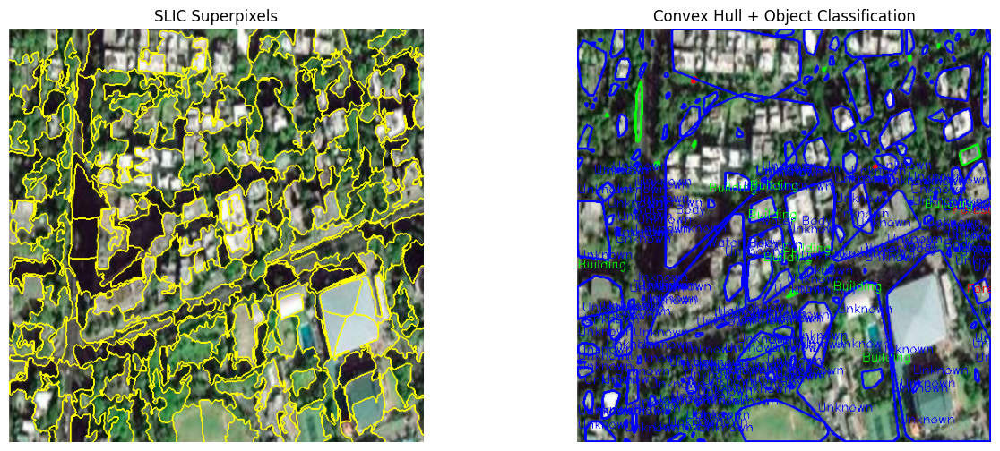

Processing sat_img1.jpg...


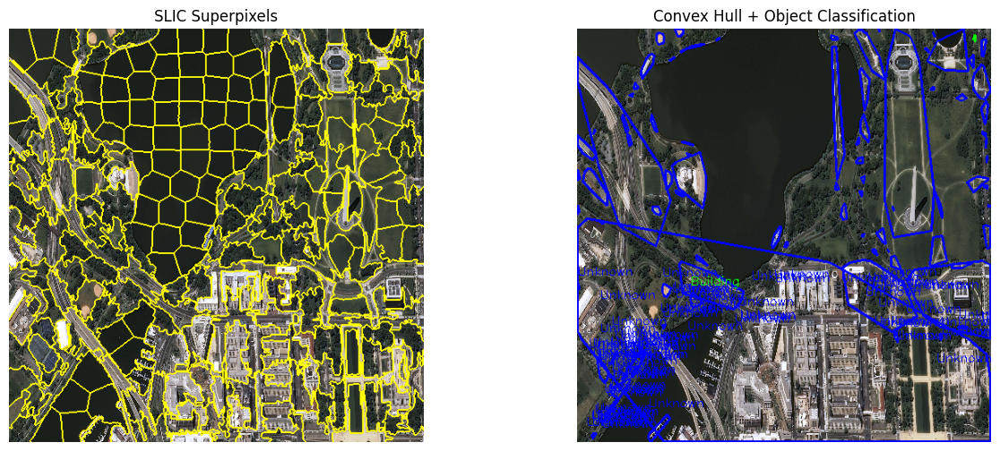

Processing sat_img7.png...


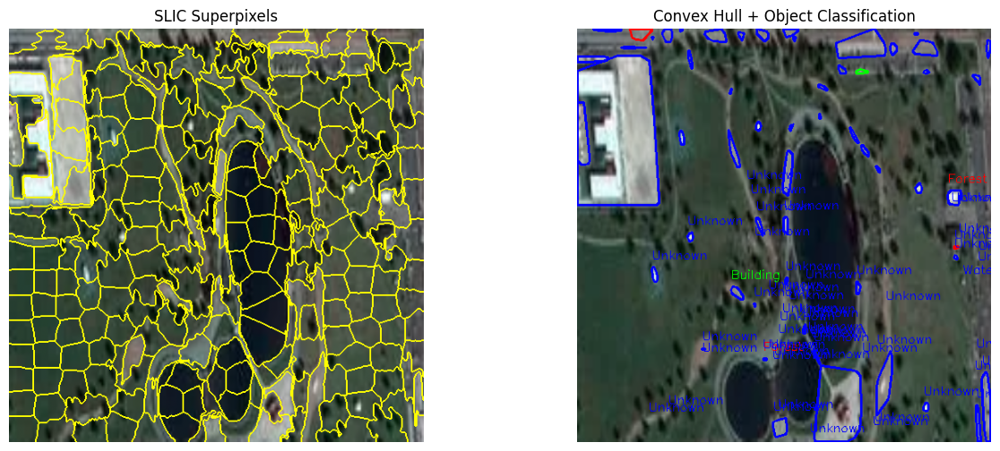

Processing sat_img2.png...


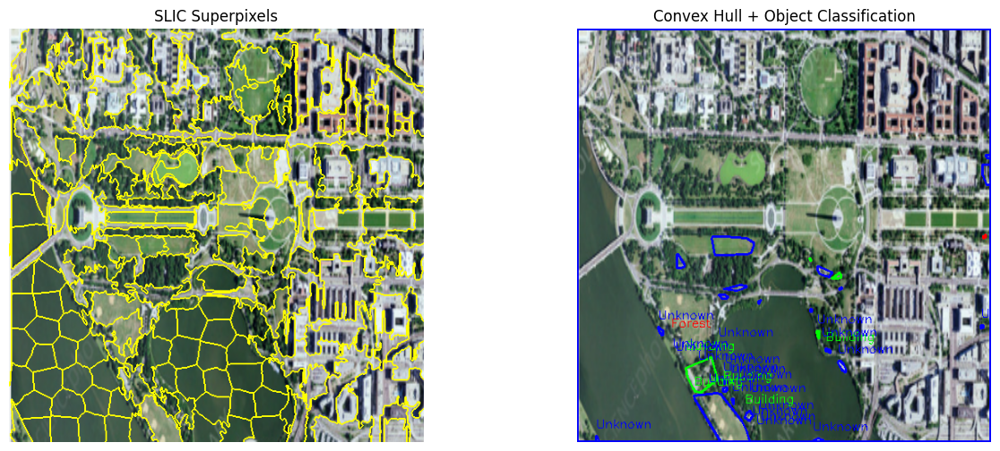

Processing sat_img8.png...


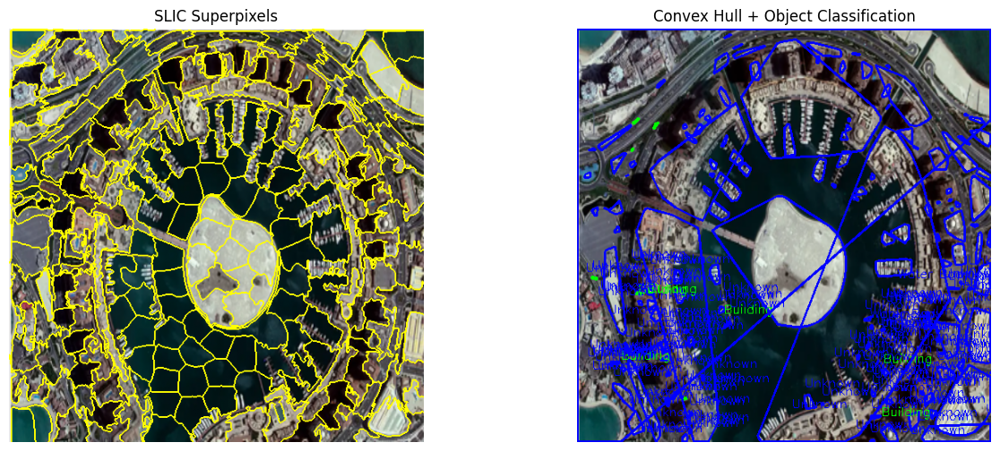

Processing sat_img3.png...


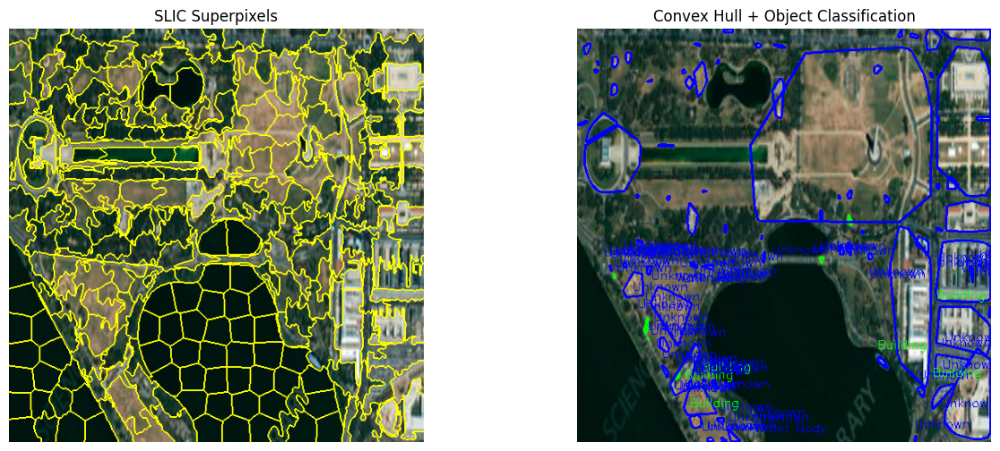

Processing sat_img9.png...


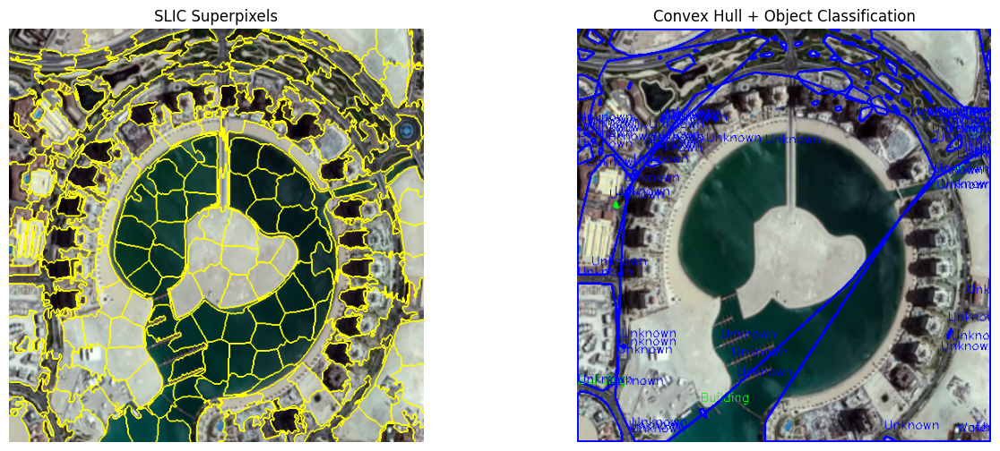

Processing sat_img5.png...


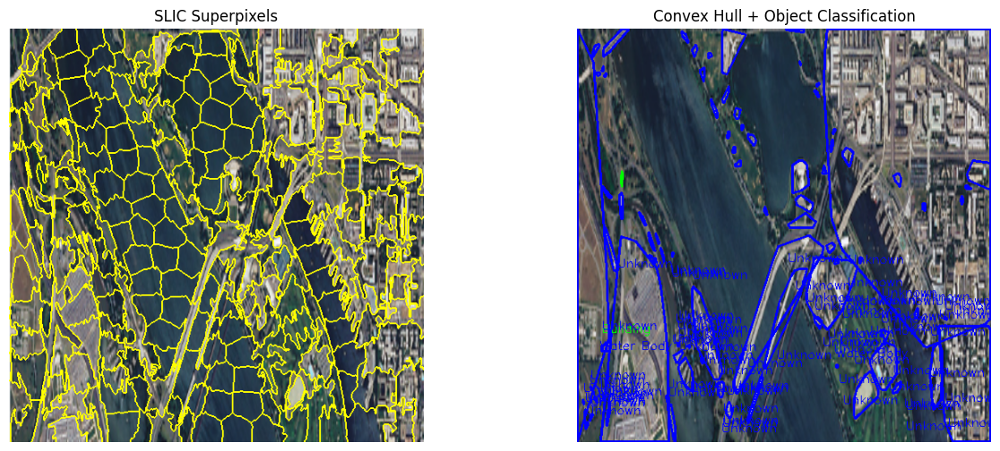

Processing sat_img10.jpeg...


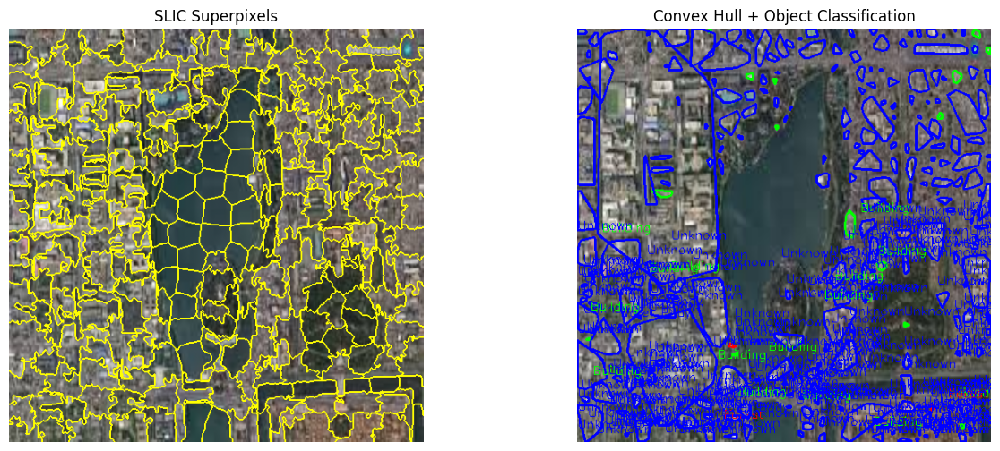

Processing sat_img4.png...


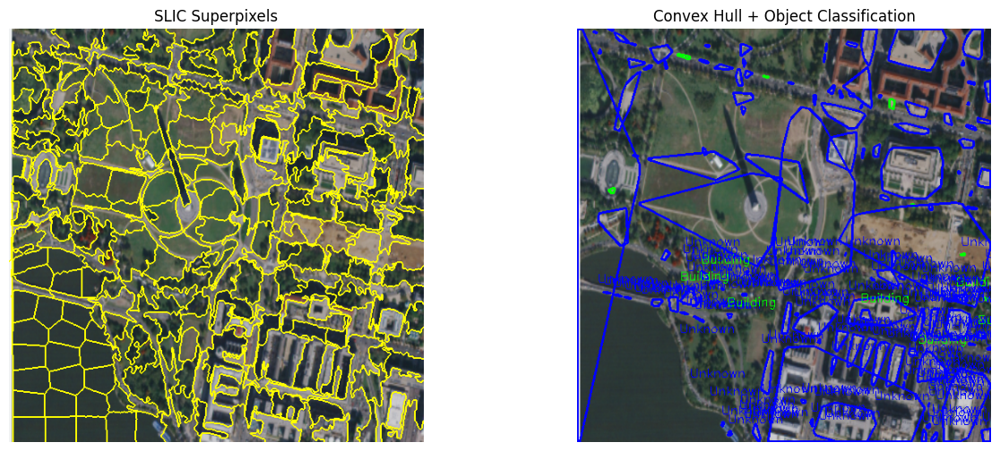

In [12]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries
from sklearn.cluster import KMeans

%matplotlib inline

# --- Preprocessing Image ---
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {img_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    return img

# --- SLIC Superpixel Segmentation ---
def segment_using_slic(img, n_segments=300):
    segments = slic(img, n_segments=n_segments, compactness=10, sigma=1)
    return segments

# --- KMeans Region Classification ---
def classify_regions(img, segments, k=3):
    features = []
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        mean_color = np.mean(img[mask], axis=0)
        features.append(mean_color)
    
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(features)
    classified_image = np.zeros_like(segments)
    
    for i, seg_id in enumerate(np.unique(segments)):
        classified_image[segments == seg_id] = labels[i]
    
    return classified_image

# --- Binary Mask Generation ---
def create_binary_mask(segmented_img):
    gray = cv2.cvtColor(segmented_img, cv2.COLOR_RGB2GRAY)
    _, mask = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))  # Fix broken edges
    return mask

# --- Contour Detection ---
def detect_objects(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

# --- Compute Convex Hull ---
def compute_convex_hull(contours):
    hulls = [cv2.convexHull(cnt) for cnt in contours if len(cnt) > 5]
    return hulls

# --- Extract Geometric Features ---
def extract_features(contour, hull):
    area_cnt = cv2.contourArea(contour)
    area_hull = cv2.contourArea(hull)
    solidity = area_cnt / area_hull if area_hull > 0 else 0
    
    perimeter = cv2.arcLength(contour, True)
    circularity = (4 * np.pi * area_cnt) / (perimeter ** 2) if perimeter > 0 else 0
    
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = w / h if h > 0 else 0
    
    return solidity, circularity, aspect_ratio

# --- Object Classification ---
def classify_objects(hulls, contours):
    classifications = []
    
    for hull, cnt in zip(hulls, contours):
        solidity, circularity, aspect_ratio = extract_features(cnt, hull)
        
        if solidity > 0.85 and 0.8 < aspect_ratio < 1.2:
            classifications.append("Building")  # High Solidity + Square Shape
        elif 0.5 < solidity <= 0.85 and circularity > 0.7:
            classifications.append("Forest")   # Medium Solidity + High Circularity
        elif solidity < 0.5 and circularity > 0.8:
            classifications.append("Water Body")  # Low Solidity + Very Circular
        else:
            classifications.append("Unknown")  
        
    return classifications

# --- Visualize Results ---
def visualize_results(image, segments, classified, contours, hulls, classifications):
    output = image.copy()
    
    for cnt, hull, cls in zip(contours, hulls, classifications):
        color = (0, 255, 0) if cls == "Building" else (255, 0, 0) if cls == "Forest" else (0, 0, 255)
        cv2.drawContours(output, [hull], -1, color, 2)
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.putText(output, cls, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    
    ax[0].imshow(mark_boundaries(image, segments))
    ax[0].set_title("SLIC Superpixels")
    ax[0].axis('off')
    
    ax[1].imshow(output)
    ax[1].set_title("Convex Hull + Object Classification")
    ax[1].axis('off')
    
    plt.show()

# --- Main Pipeline ---
def process_image(img_path):
    img = preprocess_image(img_path)
    segments = segment_using_slic(img)
    classified = classify_regions(img, segments)
    mask = create_binary_mask(img)
    contours = detect_objects(mask)
    hulls = compute_convex_hull(contours)
    classifications = classify_objects(hulls, contours)
    
    visualize_results(img, segments, classified, contours, hulls, classifications)


# --- Load Images from Desktop ---
dataset_folder ='/home/student/file'  # Change this path
image_files = [f for f in os.listdir(dataset_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:10]

# Process Each Image
for img_file in image_files:
    img_path = os.path.join(dataset_folder, img_file)
    print(f"Processing {img_file}...")
    process_image(img_path)


In [ ]:
'''    2. An industrial inspection system must detect defects in fabric rolls using GLCM-based texture analysis while ensuring rotation-invariant feature extraction.
    • Compute GLCM matrices at different orientations (0°, 45°, 90°, 135°).
    • Normalize and average features across orientations.
    • Train a support vector machine (SVM) to classify textures into defective and non-defective.
    • Evaluate performance using rotated test images.'''

 Original Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2

    accuracy                           1.00         4
   macro avg       1.00      1.00      1.00         4
weighted avg       1.00      1.00      1.00         4


Rotation-Wise Accuracy:
Rotation 0°: Accuracy = 1.00
Rotation 20°: Accuracy = 0.50
Rotation 40°: Accuracy = 0.50
Rotation 60°: Accuracy = 0.50
Rotation 80°: Accuracy = 0.50
Rotation 100°: Accuracy = 0.50
Rotation 120°: Accuracy = 0.50
Rotation 140°: Accuracy = 0.50
Good Fabric: 06227cottonhoneycombwafflehiggsandhiggscotton27.jpg

 GLCM Features:
   ➜ Contrast: 230.4669
   ➜ Dissimilarity: 11.6585
   ➜ Homogeneity: 0.0879
   ➜ Energy: 0.0225
   ➜ Correlation: 0.3707
   ➜ ASM: 0.0005


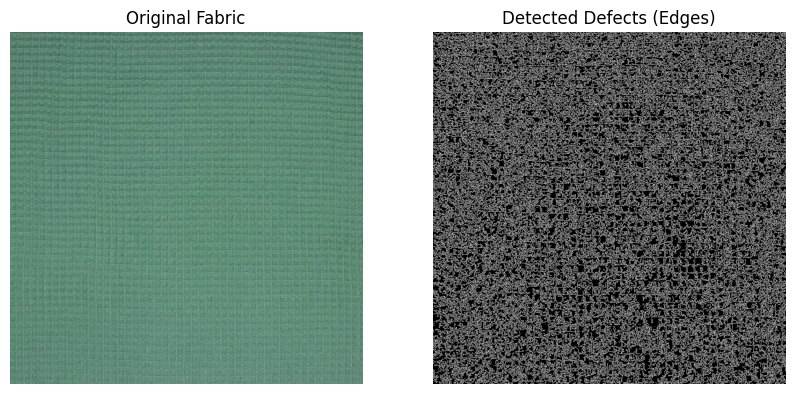

Good Fabric: il_fullxfull.5470776932_d79m.jpg

 GLCM Features:
   ➜ Contrast: 695.2539
   ➜ Dissimilarity: 21.0607
   ➜ Homogeneity: 0.0462
   ➜ Energy: 0.0141
   ➜ Correlation: 0.1880
   ➜ ASM: 0.0002


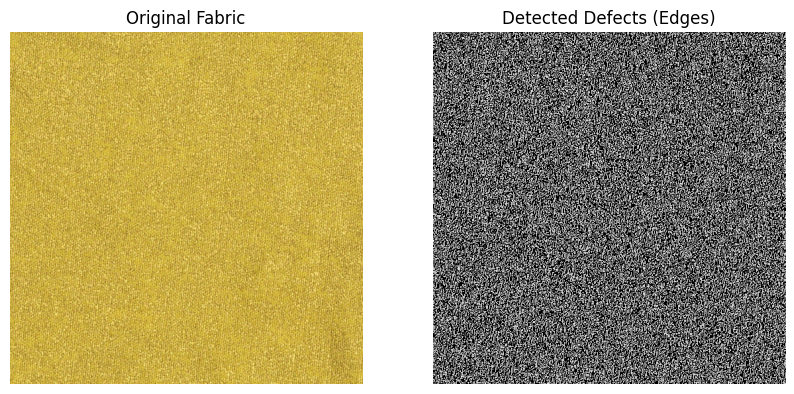

Good Fabric: cotton-9.jpg

 GLCM Features:
   ➜ Contrast: 575.8780
   ➜ Dissimilarity: 19.1630
   ➜ Homogeneity: 0.0507
   ➜ Energy: 0.0145
   ➜ Correlation: 0.4680
   ➜ ASM: 0.0002


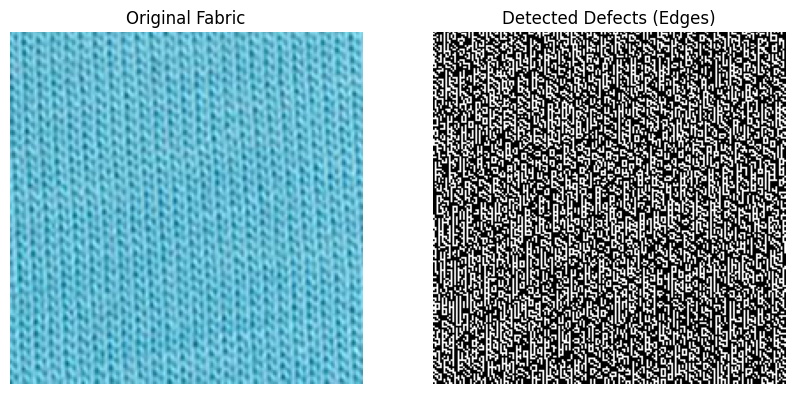

Good Fabric: Lac_-_Powder.jpg

 GLCM Features:
   ➜ Contrast: 2312.8211
   ➜ Dissimilarity: 37.9439
   ➜ Homogeneity: 0.0279
   ➜ Energy: 0.0078
   ➜ Correlation: 0.2135
   ➜ ASM: 0.0001


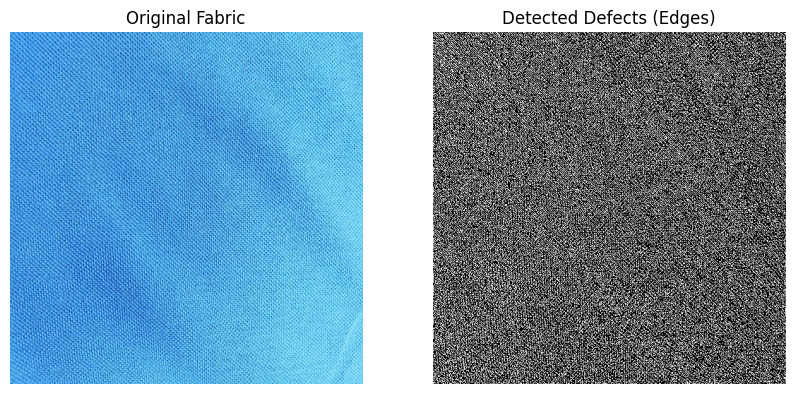

Good Fabric: images (1).jpeg

 GLCM Features:
   ➜ Contrast: 630.5965
   ➜ Dissimilarity: 19.9591
   ➜ Homogeneity: 0.0490
   ➜ Energy: 0.0176
   ➜ Correlation: -0.0961
   ➜ ASM: 0.0003


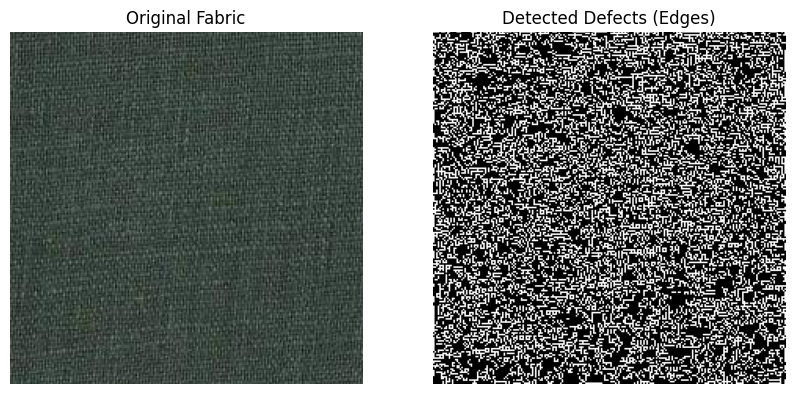

Good Fabric: images.jpeg

 GLCM Features:
   ➜ Contrast: 324.0046
   ➜ Dissimilarity: 14.1892
   ➜ Homogeneity: 0.0699
   ➜ Energy: 0.0210
   ➜ Correlation: 0.1424
   ➜ ASM: 0.0004


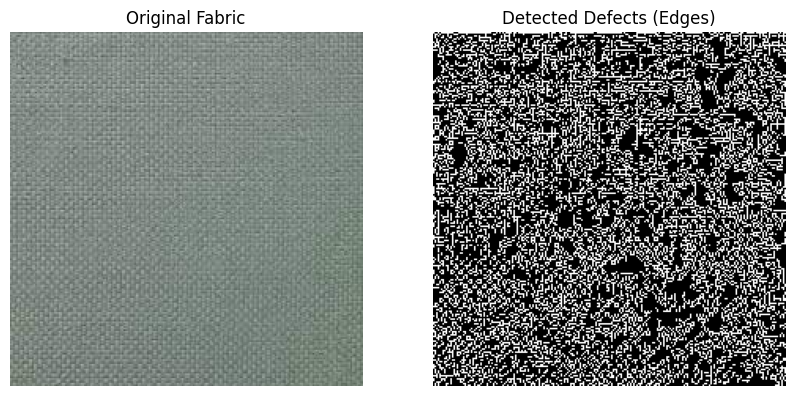

Defect Fabric: 360_F_355897240_GkhURo7LGf9Cr66qTqFro2rzuclzEztL.jpg

 GLCM Features:
   ➜ Contrast: 977.7815
   ➜ Dissimilarity: 22.8408
   ➜ Homogeneity: 0.0987
   ➜ Energy: 0.0542
   ➜ Correlation: 0.8217
   ➜ ASM: 0.0029


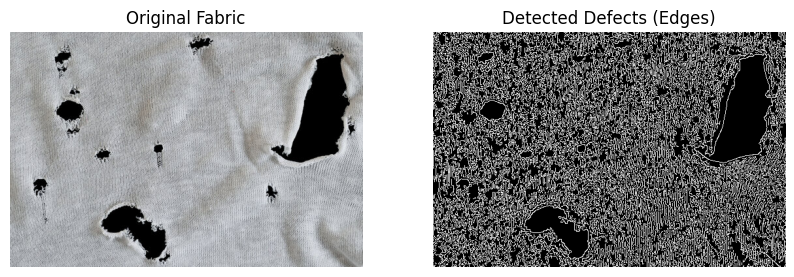

Defect Fabric: Woven-Image-with-a-No-Defect-b-Weft-Float-c-Hole-defect-d-Stain-defect-12-Method.png

 GLCM Features:
   ➜ Contrast: 207.7478
   ➜ Dissimilarity: 11.2957
   ➜ Homogeneity: 0.0873
   ➜ Energy: 0.0195
   ➜ Correlation: 0.7544
   ➜ ASM: 0.0004


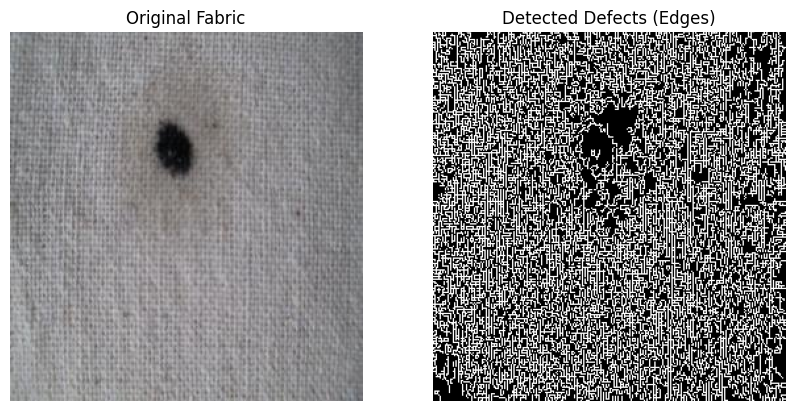

Defect Fabric: 0_Ly6n8fcp4fI4_gvS.jpg

 GLCM Features:
   ➜ Contrast: 198.2663
   ➜ Dissimilarity: 9.6524
   ➜ Homogeneity: 0.1360
   ➜ Energy: 0.0242
   ➜ Correlation: 0.8361
   ➜ ASM: 0.0006


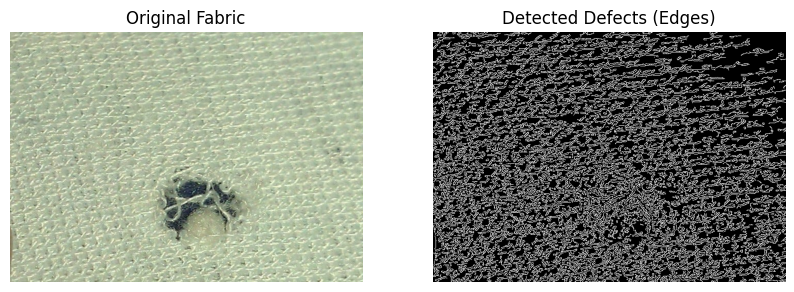

Defect Fabric: hole.jpg

 GLCM Features:
   ➜ Contrast: 5146.6620
   ➜ Dissimilarity: 57.1619
   ➜ Homogeneity: 0.0194
   ➜ Energy: 0.0055
   ➜ Correlation: 0.1928
   ➜ ASM: 0.0000


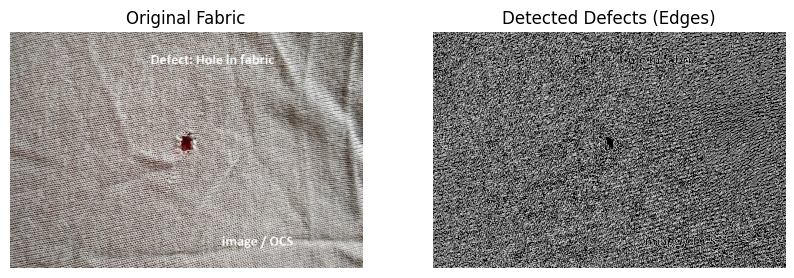

Defect Fabric: original.jpg

 GLCM Features:
   ➜ Contrast: 41.6169
   ➜ Dissimilarity: 4.9829
   ➜ Homogeneity: 0.1874
   ➜ Energy: 0.0382
   ➜ Correlation: 0.8085
   ➜ ASM: 0.0015


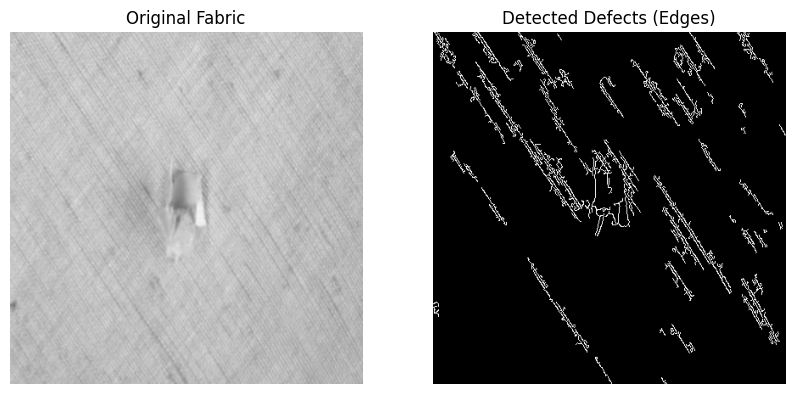

Defect Fabric: images.jpeg

 GLCM Features:
   ➜ Contrast: 18.3947
   ➜ Dissimilarity: 2.5523
   ➜ Homogeneity: 0.3952
   ➜ Energy: 0.0758
   ➜ Correlation: 0.8633
   ➜ ASM: 0.0058


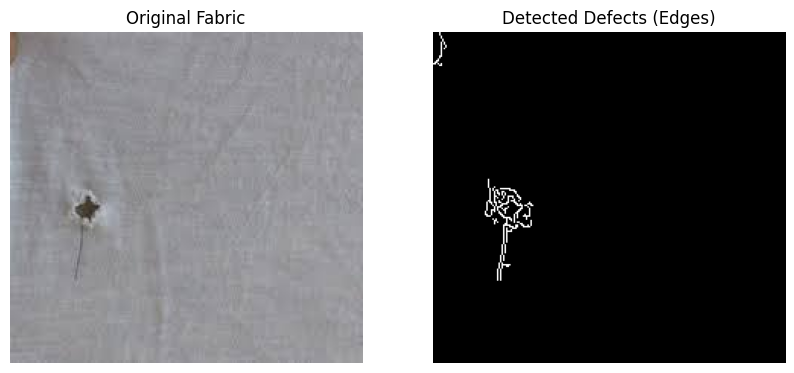

In [11]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Paths to fabric_image dataset
base_path = '/home/student/fabric_defects'
good_path = os.path.join(base_path, 'good')
defect_path = os.path.join(base_path, 'defect')

# Load image paths
good_images = [os.path.join(good_path, img) for img in os.listdir(good_path)]
defect_images = [os.path.join(defect_path, img) for img in os.listdir(defect_path)]

# Combine all images
image_paths = good_images + defect_images
y = np.array([0] * len(good_images) + [1] * len(defect_images))  # 0 = Good Fabric, 1 = Defect Fabric

# GLCM Parameters
distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']

# Rotation Angles
rotation_angles = [0, 20, 40, 60, 80, 100, 120, 140]

# Function to extract GLCM features
def extract_glcm_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    glcm = graycomatrix(gray, distances, angles, levels=256, symmetric=True, normed=True)
    features = [np.mean(graycoprops(glcm, prop)) for prop in properties]
    return features

# Function to detect defect edges
def detect_defects(image):
    edges = cv2.Canny(image, 50, 150)
    return edges

# Visualize GLCM features & defect edges
def display_fabric_with_edges(image_paths, labels):
    for path, label in zip(image_paths, labels):
        image = cv2.imread(path)
        features = extract_glcm_features(image)
        edges = detect_defects(image)

        feature_names = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation', 'ASM']
        fabric_type = 'Good Fabric' if label == 0 else 'Defect Fabric'
        
        print(f"{fabric_type}: {os.path.basename(path)}\n")
        print(" GLCM Features:")
        for name, value in zip(feature_names, features):
            print(f"   ➜ {name}: {value:.4f}")

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Original Fabric")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(edges, cmap='gray')
        plt.title("Detected Defects (Edges)")
        plt.axis('off')
        
        plt.show()

# Extract GLCM features for all images
X = [extract_glcm_features(cv2.imread(img)) for img in image_paths]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train SVM classifier
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, stratify=y, random_state=42)
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)

# Predict on original test data
y_pred = svm_model.predict(X_test)
print(" Original Classification Report:\n", classification_report(y_test, y_pred))

# Rotation-Invariant Performance
rotation_accuracies = {}

for angle in rotation_angles:
    accuracies = []
    for img, label in zip(X_test, y_test):
        original_img = cv2.imread(image_paths[y.tolist().index(label)])
        
        # Rotate the image
        if angle != 0:
            rotation_matrix = cv2.getRotationMatrix2D((original_img.shape[1]//2, original_img.shape[0]//2), angle, 1)
            rotated_img = cv2.warpAffine(original_img, rotation_matrix, (original_img.shape[1], original_img.shape[0]))
        else:
            rotated_img = original_img
        
        # Extract GLCM features for rotated image
        features = extract_glcm_features(rotated_img)
        scaled_features = scaler.transform([features])
        prediction = svm_model.predict(scaled_features)
        accuracies.append(prediction[0])

    rotation_accuracies[angle] = accuracy_score(y_test, accuracies)

# Display rotation-wise accuracy
print("\nRotation-Wise Accuracy:")
for angle, acc in rotation_accuracies.items():
    print(f"Rotation {angle}°: Accuracy = {acc:.2f}")

# Visualize GLCM features & defect edges
display_fabric_with_edges(image_paths, y)


In [ ]:
'''    3. A biometric authentication system needs to differentiate between real human faces and spoofed images (e.g., printed photos used to bypass facial recognition).
    • Capture face images and apply LBP feature extraction.
    • Train a deep learning model to classify real vs. spoofed faces.
    • Implement real-time processing for anti-spoofing detection.
    • Test the system against different spoofing attacks (printed images, 3D masks).'''

Class Distribution - Fake: 960, Real: 1081
Accuracy: 0.59
              precision    recall  f1-score   support

        Fake       0.56      0.59      0.58       288
        Real       0.62      0.59      0.61       325

    accuracy                           0.59       613
   macro avg       0.59      0.59      0.59       613
weighted avg       0.59      0.59      0.59       613

Confusion Matrix:
[[170 118]
 [132 193]]
Cross-validation scores: [0.58391608 0.58041958 0.59090909 0.56140351 0.58947368]


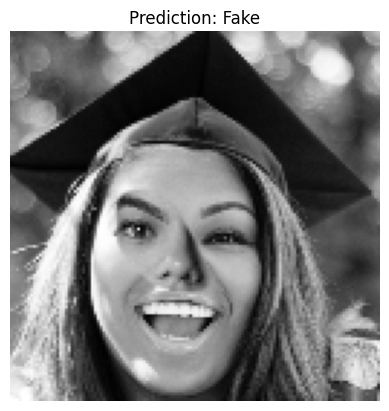

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern, hog
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler

# Parameters for LBP
radius = 1
n_points = 8 * radius

def extract_features(image, radius=1, n_points=8):
    """Extract LBP and HOG features from an image."""
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    lbp_hist = lbp_hist.astype("float") / (lbp_hist.sum() + 1e-6)
    
    hog_features = hog(image, orientations=9, pixels_per_cell=(8, 8),
                       cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False)
    
    return np.hstack([lbp_hist, hog_features])

def load_dataset(real_path, fake_path):
    """Load images and extract features."""
    data = []
    labels = []
    
    for label, path in [(1, real_path), (0, fake_path)]:
        for filename in os.listdir(path):
            if filename.endswith('.jpg') or filename.endswith('.png'):
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if image is None:
                    continue  # Skip unreadable images
                image = cv2.resize(image, (128, 128))  # Resize for consistency
                features = extract_features(image, radius, n_points)
                data.append(features)
                labels.append(label)
    
    return np.array(data), np.array(labels)

# Set paths manually
real_images_path = '/home/student/Downloads/real_and_fake_face/training_real'
fake_images_path = '/home/student/Downloads/real_and_fake_face/training_fake'

# Load dataset
data, labels = load_dataset(real_images_path, fake_images_path)

# Check class balance
unique, counts = np.unique(labels, return_counts=True)
print(f"Class Distribution - Fake: {counts[0]}, Real: {counts[1]}")

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42, stratify=labels)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train SVM classifier with class balancing
svm = SVC(kernel='linear', probability=True, class_weight='balanced', C=0.1, random_state=42)
svm.fit(X_train, y_train)

# Evaluate classifier
y_pred = svm.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred):.2f}')
print(classification_report(y_test, y_pred, target_names=['Fake', 'Real']))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Cross-validation check
scores = cross_val_score(svm, X_train, y_train, cv=5)
print("Cross-validation scores:", scores)

# Real-time anti-spoofing detection
def detect_spoofing(image_path, model, scaler, radius=1, n_points=8):
    """Detect if an image is real or fake."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print("Error: Unable to read image")
        return
    image = cv2.resize(image, (128, 128))
    features = extract_features(image, radius, n_points)
    features = scaler.transform([features])
    prediction = model.predict(features)[0]
    label = 'Real' if prediction == 1 else 'Fake'
    plt.imshow(image, cmap='gray')
    plt.title(f'Prediction: {label}')
    plt.axis('off')
    plt.show()

# Test with a sample image
sample_image_path = '/home/student/Downloads/real_and_fake_face/training_fake/easy_22_1010.jpg'
detect_spoofing(sample_image_path, svm, scaler)